# Dataset Annoteren met Getraind Yolo-V8(n) Model

In [1]:
import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from ultralytics import YOLO
import logging
import sys

In [2]:
# Configure logging
log_filename = 'D4.1.2 annotation_log.txt'
logging.basicConfig(level=logging.INFO, format='%(message)s', handlers=[
    logging.FileHandler(log_filename),
    logging.StreamHandler(sys.stdout)
])

# Redirect stdout and stderr to log file
class Logger:
    def __init__(self, filename="annotation_log.txt"):
        self.terminal = sys.stdout
        self.log = open(filename, "a")

    def write(self, message):
        self.terminal.write(message)
        self.log.write(message)

    def flush(self):
        pass

sys.stdout = Logger(log_filename)
sys.stderr = Logger(log_filename)

# Laad het getrainde model
model = YOLO('runs/detect/train9/weights/best.pt')

# Map met afbeeldingen
image_folder = 'Data/input/images_resized'

# Output CSV bestand
output_csv = 'D4.1.2_auto_annotations.csv'

In [3]:
# Functie om annotaties op te slaan in een DataFrame
def save_annotations_to_csv(image_path, box, label, annotations_list):
    x_center = (box[0] + box[2]) / 2
    y_center = (box[1] + box[3]) / 2
    width = box[2] - box[0]
    height = box[3] - box[1]
    annotations_list.append([os.path.basename(image_path), label, x_center, y_center, width, height])

# Selecteer alle afbeeldingen voor annotatie
image_files = [f for f in os.listdir(image_folder) if f.endswith('.jpg')]

# Lijst om annotaties op te slaan
annotations_list = []

# Voer voorspellingen uit en sla annotaties op
for image_file in tqdm(image_files, desc="Annotating images"):
    image_path = os.path.join(image_folder, image_file)
    image = cv2.imread(image_path)

    # Voorspelling doen
    results = model(image_path, imgsz=128)  # Instellen van afbeeldingsgrootte op 128x128

    # Controleer of er resultaten zijn
    if results and results[0].boxes is not None and len(results[0].boxes) > 0:
        # Verkrijg de bounding boxes en confidence scores
        boxes = results[0].boxes.xyxy.cpu().numpy()
        scores = results[0].boxes.conf.cpu().numpy()
        labels = results[0].boxes.cls.cpu().numpy().astype(int)
        names = [model.names[label] for label in labels]

        # Selecteer de bounding box met de hoogste confidence score
        max_score_idx = scores.argmax()
        best_box = boxes[max_score_idx]
        best_label = names[max_score_idx]

        # Sla de annotatie op in de lijst
        save_annotations_to_csv(image_path, best_box, best_label, annotations_list)
    else:
        logging.info(f"No detections for {image_path}")

# Zet de annotaties om in een DataFrame en sla op als CSV
annotations_df = pd.DataFrame(annotations_list, columns=['image_name', 'label', 'x_center', 'y_center', 'width', 'height'])
annotations_df.to_csv(output_csv, index=False)

# Controleer de output CSV
if os.path.exists(output_csv):
    logging.info(f"Annotations saved to {output_csv}")
else:
    logging.error("Error: Failed to save annotations.")

Annotating images:   0%|          | 0/39445 [00:00<?, ?it/s]


image 1/1 c:\Users\Gebruiker\Documents\Fontys\S6 - AI\Personal - Data Driven Challenge\arise-challenge-algorithm\Data\input\images_resized\102_20200628004052_18636.jpg: 128x128 3 Insects, 25.0ms
Speed: 0.0ms preprocess, 25.0ms inference, 0.0ms postprocess per image at shape (1, 3, 128, 128)

image 1/1 c:\Users\Gebruiker\Documents\Fontys\S6 - AI\Personal - Data Driven Challenge\arise-challenge-algorithm\Data\input\images_resized\102_20200628004052_18637.jpg: 128x128 3 Insects, 21.3ms
Speed: 0.0ms preprocess, 21.3ms inference, 1.4ms postprocess per image at shape (1, 3, 128, 128)

image 1/1 c:\Users\Gebruiker\Documents\Fontys\S6 - AI\Personal - Data Driven Challenge\arise-challenge-algorithm\Data\input\images_resized\102_20200628004052_18638.jpg: 128x128 3 Insects, 24.3ms
Speed: 1.0ms preprocess, 24.3ms inference, 1.0ms postprocess per image at shape (1, 3, 128, 128)

image 1/1 c:\Users\Gebruiker\Documents\Fontys\S6 - AI\Personal - Data Driven Challenge\arise-challenge-algorithm\Data\in

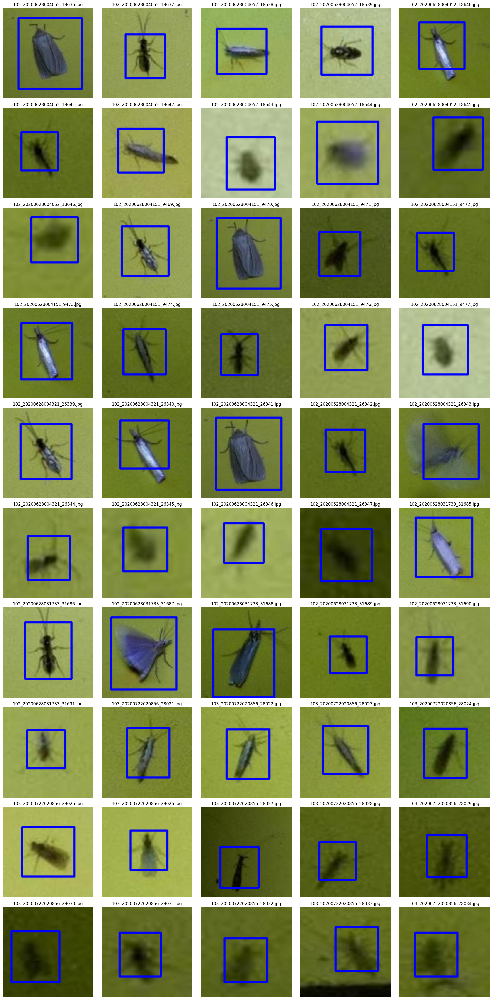

In [4]:
# Visualisatie van 50 geannoteerde afbeeldingen
def plot_annotated_images(image_folder, annotations_df, num_images=50):
    fig, axs = plt.subplots(10, 5, figsize=(20, 40))
    axs = axs.flatten()

    for i, row in annotations_df.head(num_images).iterrows():
        image_path = os.path.join(image_folder, row['image_name'])
        image = cv2.imread(image_path)
        x_center = int(row['x_center'])
        y_center = int(row['y_center'])
        width = int(row['width'])
        height = int(row['height'])
        x1 = x_center - width // 2
        y1 = y_center - height // 2
        x2 = x_center + width // 2
        y2 = y_center + height // 2

        image = cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
        axs[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axs[i].set_title(row['image_name'])
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()

# Lees de annotaties CSV
annotations_df = pd.read_csv(output_csv)

# Plot de geannoteerde afbeeldingen
plot_annotated_images(image_folder, annotations_df, num_images=50)